# Surprise Housing - Advanced Regression using Regularisation

## Problem Statement
A US-based housing company named Surprise Housing has decided to enter the Australian market. The company uses data analytics to purchase houses at a price below their actual values and flip them on at a higher price. For the same purpose, the company has collected a data set from the sale of houses in Australia. The data is provided in the CSV file below.

The company is looking at prospective properties to buy to enter the market. You are required to build a regression model using regularisation in order to predict the actual value of the prospective properties and decide whether to invest in them or not.

The company wants to know:
- Which variables are significant in predicting the price of a house, and
- How well those variables describe the price of a house.

Also, determine the optimal value of lambda for ridge and lasso regression.

## Business Goal
We are required to model the price of houses with the available independent variables. This model will then be used by the management to understand how exactly the prices vary with the variables. They can accordingly manipulate the strategy of the firm and concentrate on areas that will yield high returns. Further, the model will be a good way for management to understand the pricing dynamics of a new market.

## 1. Reading and Understanding the Data

In [1]:
# Supress Warnings
import warnings
warnings.filterwarnings('ignore')

# Import libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import datetime

# Adjusting jupyter views
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)

In [2]:
# Read the given data file
df = pd.read_csv("train.csv")
df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [3]:
# Inspecting the data
print(df.shape)

(1460, 81)


There are 1460 rows and 81 columns.

In [4]:
print(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

Out of 81 columns, 3 are float, 35 are int and 43 are of object type.

In [5]:
# Check null values
df.isnull().sum()

Id                  0
MSSubClass          0
MSZoning            0
LotFrontage       259
LotArea             0
Street              0
Alley            1369
LotShape            0
LandContour         0
Utilities           0
LotConfig           0
LandSlope           0
Neighborhood        0
Condition1          0
Condition2          0
BldgType            0
HouseStyle          0
OverallQual         0
OverallCond         0
YearBuilt           0
YearRemodAdd        0
RoofStyle           0
RoofMatl            0
Exterior1st         0
Exterior2nd         0
MasVnrType          8
MasVnrArea          8
ExterQual           0
ExterCond           0
Foundation          0
BsmtQual           37
BsmtCond           37
BsmtExposure       38
BsmtFinType1       37
BsmtFinSF1          0
BsmtFinType2       38
BsmtFinSF2          0
BsmtUnfSF           0
TotalBsmtSF         0
Heating             0
HeatingQC           0
CentralAir          0
Electrical          1
1stFlrSF            0
2ndFlrSF            0
LowQualFin

In [6]:
# Percentage of missing values in each column
(df.isnull().sum() / len(df) * 100).sort_values(ascending=False).head(15)

PoolQC          99.520548
MiscFeature     96.301370
Alley           93.767123
Fence           80.753425
FireplaceQu     47.260274
LotFrontage     17.739726
GarageYrBlt      5.547945
GarageCond       5.547945
GarageType       5.547945
GarageFinish     5.547945
GarageQual       5.547945
BsmtFinType2     2.602740
BsmtExposure     2.602740
BsmtQual         2.534247
BsmtCond         2.534247
dtype: float64

From the data description, it seems there are columns that have "NA" as values which have been read as NaN by pandas.
For example:
- Alley has "NA" listed as "No alley access"
- FireplaceQu has "NA" as "No Fireplace"
- MiscFeature has "NA" as None.
- BsmtQual, BsmtCond has "NA" as "No Basement"

They are not null, but has been read as null by pandas. That's why we see so many null values in the dataset. 

Even if we fill these large number of null values with some data, they would become noise while building the model. It is better to drop them.

In [7]:
# Dropping Columns with missing values above 40%
df.drop(['PoolQC','MiscFeature','Alley','Fence','FireplaceQu'], axis=1, inplace=True)

In [8]:
# let's check remaining columns with large number of NaN values (< 40%)
df[['LotFrontage','MasVnrArea','GarageYrBlt']].describe()

,LotFrontage,MasVnrArea,GarageYrBlt
count,1201.000000,1452.000000,1379.000000
mean,70.049958,103.685262,1978.506164
std,24.284752,181.066207,24.689725
min,21.000000,0.000000,1900.000000
25%,59.000000,0.000000,1961.000000
50%,69.000000,0.000000,1980.000000
75%,80.000000,166.000000,2002.000000
max,313.000000,1600.000000,2010.000000


In [9]:
df['LotFrontage']= df.LotFrontage.fillna(df.LotFrontage.median()) # outliers present, imputing with median
df['MasVnrArea']= df.MasVnrArea.fillna(df.MasVnrArea.median())    # outliers present, imputing with median
df['GarageYrBlt']= df.GarageYrBlt.fillna(df.GarageYrBlt.mean())   # outliers not present, imputing with mean

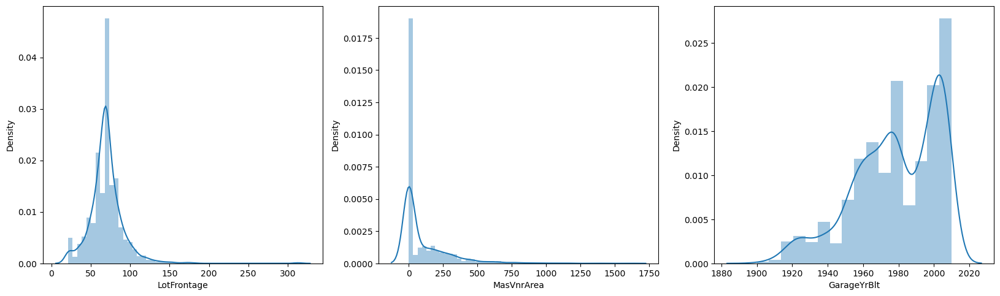

In [10]:
plt.figure(figsize=(20, 12))
plt.subplot(2,3,1)
sns.distplot(df['LotFrontage'])
plt.subplot(2,3,2)
sns.distplot(df['MasVnrArea'])
plt.subplot(2,3,3)
sns.distplot(df['GarageYrBlt'])
plt.show()

In [11]:
# Percentage of missing values in each column
(df.isnull().sum() / len(df) * 100).sort_values(ascending=False).head(15)

GarageType      5.547945
GarageFinish    5.547945
GarageQual      5.547945
GarageCond      5.547945
BsmtExposure    2.602740
BsmtFinType2    2.602740
BsmtFinType1    2.534247
BsmtQual        2.534247
BsmtCond        2.534247
MasVnrType      0.547945
Electrical      0.068493
FullBath        0.000000
BsmtHalfBath    0.000000
TotRmsAbvGrd    0.000000
BsmtFullBath    0.000000
dtype: float64

In [12]:
# As found earlier, for basement related parameters, NA means 'No Basement'.
for col in ['BsmtExposure', 'BsmtFinType2', 'BsmtFinType1', 'BsmtCond', 'BsmtQual']:
    df[col] = df[col].replace(np.nan, 'No Basement')

In [13]:
# As found earlier, for garage related parameters, NA means 'No Garage'.
for col in ['GarageType', 'GarageFinish', 'GarageCond', 'GarageQual', 'MasVnrType', 'Electrical']:
    df[col] = df[col].replace(np.nan, 'No Garage')

In [14]:
# Percentage of missing values in each column
(df.isnull().sum() / len(df) * 100).sort_values(ascending=False).head(15)

Id              0.0
FullBath        0.0
Fireplaces      0.0
Functional      0.0
TotRmsAbvGrd    0.0
KitchenQual     0.0
KitchenAbvGr    0.0
BedroomAbvGr    0.0
HalfBath        0.0
BsmtHalfBath    0.0
MSSubClass      0.0
BsmtFullBath    0.0
GrLivArea       0.0
LowQualFinSF    0.0
2ndFlrSF        0.0
dtype: float64

There are no null values remaining in the dataset.

There are some paramters that are represented as numerical values, but are actually categorical in nature.
Changing their datatype to object.

In [15]:
# Converting variables that are categorical in nature to object type
df[['MSSubClass', 'OverallQual', 'OverallCond']] = df[['MSSubClass', 'OverallQual', 'OverallCond']].astype('object')

In [16]:
# Converting variables that are numerical in nature to numeric type
df['LotFrontage'] = pd.to_numeric(df['LotFrontage'], errors='coerce')
df['MasVnrArea'] = pd.to_numeric(df['MasVnrArea'], errors='coerce')

<AxesSubplot:xlabel='Id', ylabel='Density'>

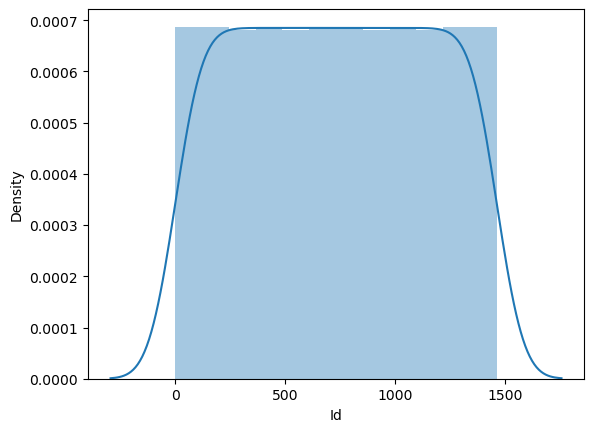

In [17]:
sns.distplot(df['Id'])

Id is of no use, will not yield anything while building the model. Dropping it.

In [18]:
df.drop(['Id'], axis=1, inplace=True)

## 2. Data Exploration

### Univariate Analysis

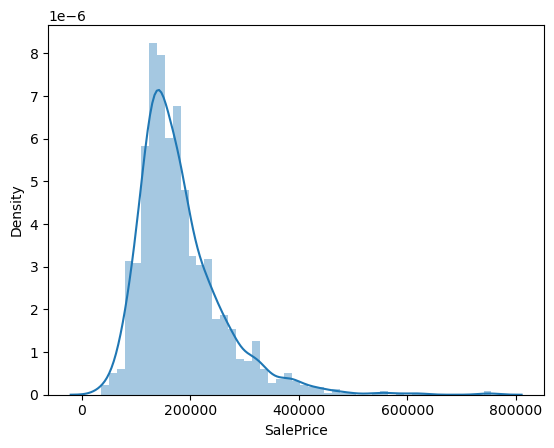

In [19]:
# Let's check the target variable first
sns.distplot(df['SalePrice'])
plt.show()

SalePrice is skewed to the right. We might have to transform it using log to make it normally distributed.

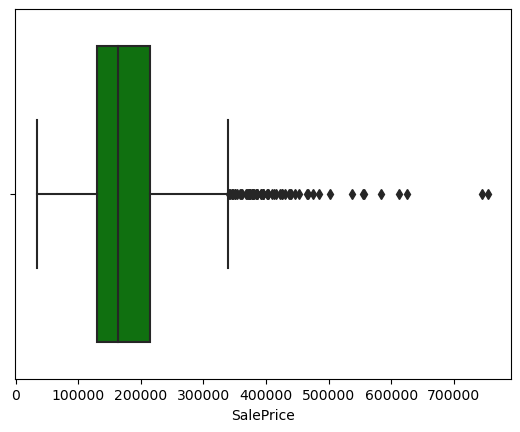

In [20]:
sns.boxplot(x=df['SalePrice'], color='green')
plt.show()

There are outliers here. We'll check other columns for outliers as well.

In [21]:
# Identify numerical and non-numerical columns
num_cols = []
cat_cols = []

for col in list(df):
    if df[col].dtypes == 'object':
        cat_cols.append(col)  
    else:
        num_cols.append(col)

print('Numerical columns:\n', num_cols)
print('\nCategorical columns:\n', cat_cols)

Numerical columns:
 ['LotFrontage', 'LotArea', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal', 'MoSold', 'YrSold', 'SalePrice']

Categorical columns:
 ['MSSubClass', 'MSZoning', 'Street', 'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'OverallQual', 'OverallCond', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'GarageType', 'GarageF

In [22]:
len(num_cols)

34

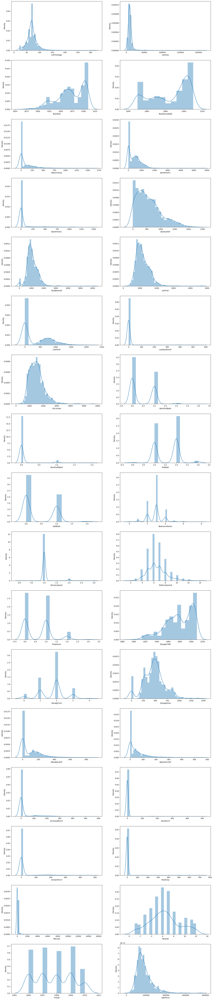

In [23]:
# Visualising numerical variables
plt.figure(figsize=(20, 100))
i = 1
for col in num_cols:
    plt.subplot(17, 2, i)
    sns.distplot(df[col])
    i += 1
plt.show()

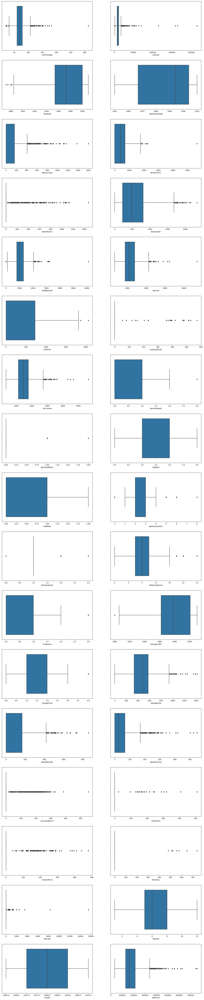

In [24]:
# Visualising outliers in numerical variables
plt.figure(figsize=(20, 100))
i = 1
for col in num_cols:
    plt.subplot(17, 2, i)
    sns.boxplot(df[col])
    i += 1
plt.show()

There are many variables that have outliers. We'll definitely need to remove those.

### Outlier removal for numerical variables

In [25]:
for col in num_cols:
    lower_quartile = df[col].quantile(0.25)
    upper_quartile = df[col].quantile(0.75)
    IQR = upper_quartile - lower_quartile
    lower_fence = lower_quartile - (1.5 * IQR)
    upper_fence = upper_quartile + (1.5 * IQR)

    df[col] = np.where(df[col] > upper_fence, 
                            upper_fence,   
                            df[col])

    df[col] = np.where(df[col] < lower_fence,
                           lower_fence,
                           df[col])

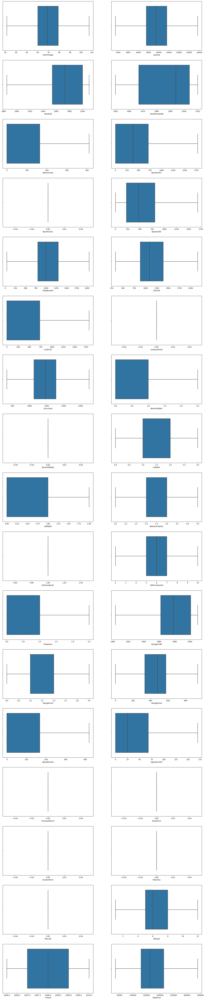

In [26]:
# Visualising outliers in numerical variables
plt.figure(figsize=(20, 100))
i = 1
for col in num_cols:
    plt.subplot(17, 2, i)
    sns.boxplot(df[col])
    i += 1
plt.show()

In [27]:
df.shape

(1460, 75)

In [28]:
len(cat_cols)

41

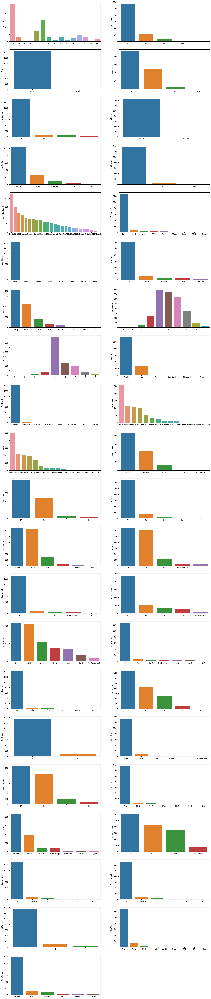

In [29]:
# Visualising categorical variables
plt.figure(figsize=(20, 100))
i = 1
for col in cat_cols:
    plt.subplot(21, 2, i)
    sns.barplot(df[col].value_counts().index, df[col].value_counts())
    i += 1
plt.show()

There aren't any variables with just one value in all rows.

### Bivariate analysis

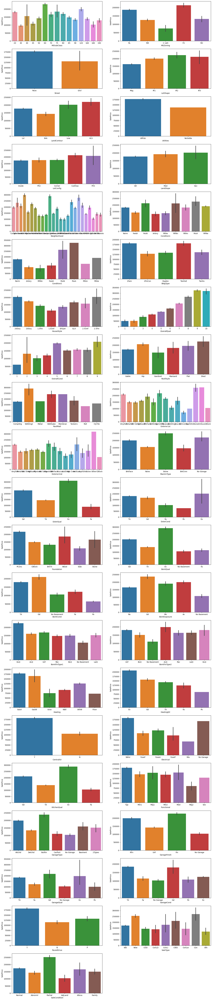

In [30]:
# Visualising categorical variables wrt target variable SalePrice
plt.figure(figsize=(20, 100))
i = 1
for col in cat_cols:
    plt.subplot(21, 2, i)
    sns.barplot(data=df, y='SalePrice', x=col)
    i += 1
plt.show()

#### Some observations:
- The SalePrice is higher if the street is paved.
- Floating Village Residential has higher SalePrice compared to other zoning classifications.
- If the lot shape is slightly irregular, the saleprice is higher
- SalePrice is lower if land is severely sloped
- SalePrice is higher if overall material and finish of the house is excellent.

### Multivariate analysis

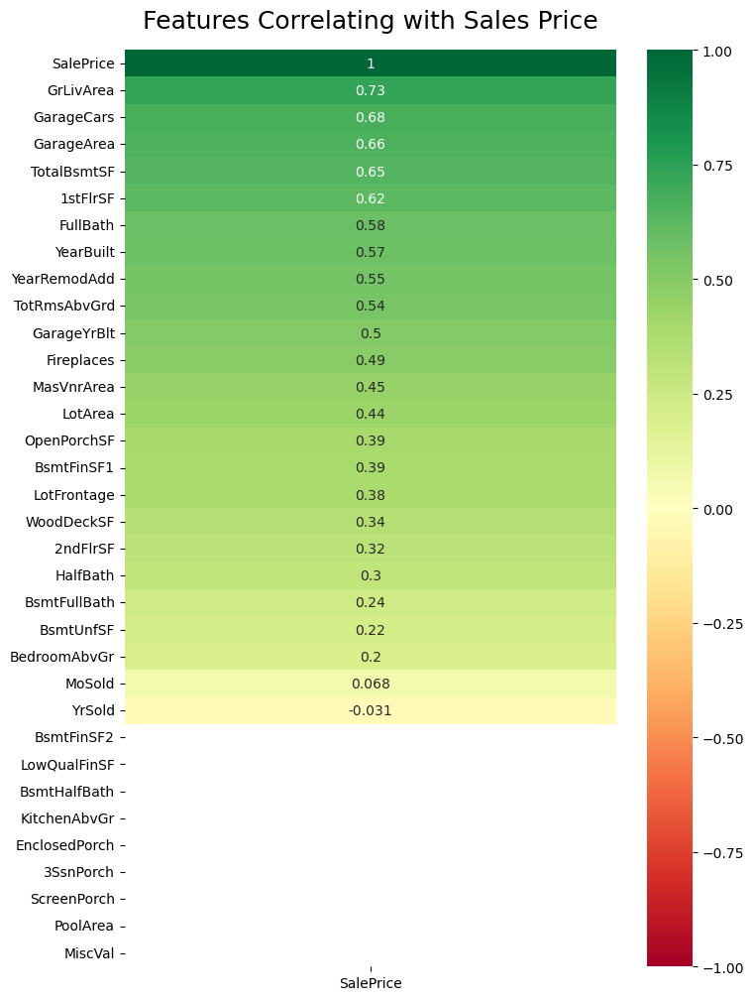

In [32]:
plt.figure(figsize=(8, 12))
heatmap_outputvar = sns.heatmap(df.corr()[['SalePrice']].sort_values(by='SalePrice', ascending=False), vmin=-1, vmax=1, annot=True, cmap='RdYlGn')
heatmap_outputvar.set_title('Features Correlating with Sales Price', fontdict={'fontsize':18}, pad=16);

#### Observations:
- Target variable SalePrice is positively correlated with GrLivArea, GarageCars, GarageArea, FullBath and YearBuilt

In [35]:
# # Pairplot of numerical variables
# sns.pairplot(df[num_cols])
# plt.show()

## 3. Feature Engineering

### Derived feature

In [33]:
# Create new variable age = current year - year built
df["Age"] = datetime.datetime.now().year - df['YearBuilt']
df.drop(['YearBuilt'], axis = 1, inplace = True)

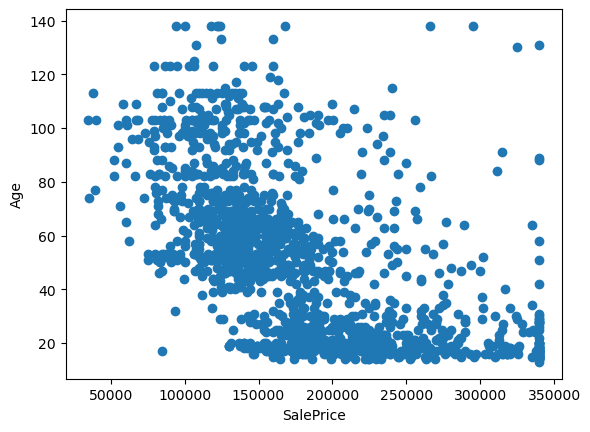

In [34]:
plt.scatter(x=df['SalePrice'], y=df['Age'])
plt.xlabel("SalePrice"); plt.ylabel("Age");

In [35]:
# Also remove from numerical variables list
num_cols.remove('YearBuilt')

In [49]:
# mapping numeric representation of categorical values
df.OverallQual.replace({10:"Very_Excellent", 9:"Excellent", 8:"Very_Good", 7:"Good",6:"Above_Average",5:"Average",4:"Below_Average",3:"Fair",2:"Poor",1:"Very_Poor"},inplace = True)

# mapping numeric representation of categorical values
df.OverallCond.replace({10:"Very_Excellent", 9:"Excellent", 8:"Very_Good", 7:"Good",6:"Above_Average",5:"Average",4:"Below_Average",3:"Fair",2:"Poor",1:"Very_Poor"},inplace = True)

# mapping numeric representation of categorical values
df.MoSold.replace({1: 'jan', 2: 'feb', 3: 'mar', 4: 'apr', 5: 'may', 6: 'jun',
                  7: 'jul', 8: 'aug', 9: 'sept', 10: 'oct', 11: 'nov', 12: 'dec'},inplace = True)

In [50]:
# Re-calculating numerical and non-numerical variables as we have changed the datatype for few of them
num_cols = []
cat_cols = []

for col in list(df):
    if df[col].dtypes == 'object':
        cat_cols.append(col)  
    else:
        num_cols.append(col)

print('Numerical columns:\n', num_cols)
print('\nCategorical columns:\n', cat_cols)

Numerical columns:
 ['LotFrontage', 'LotArea', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal', 'YrSold', 'SalePrice', 'Age']

Categorical columns:
 ['MSSubClass', 'MSZoning', 'Street', 'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'OverallQual', 'OverallCond', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'GarageType', 'GarageFinish', 'GarageQ

### Dummy variables

In [51]:
# Get dummy variables in a dataframe
df_dummy = pd.get_dummies(df[cat_cols], drop_first=True)

In [52]:
# Concat dummy variables with the original dataframe
df_concat = pd.concat([df, df_dummy], axis=1)
df_concat.shape

(1460, 324)

In [53]:
# Delete original columns
df_concat = df_concat.drop(cat_cols, axis = 1)
df_concat.shape

(1460, 282)

### Train-test split
Splitting the data into Training and Testing sets.

In [54]:
from sklearn.model_selection import train_test_split

X = df_concat.drop('SalePrice', axis=1)
y = df_concat['SalePrice']

In [55]:
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.7, test_size=0.3, random_state=100)
print('X_train Shape:', X_train.shape)
print('X_test Shape:', X_test.shape)
print('y_train Shape:', y_train.shape)
print('y_test Shape:', y_test.shape)

X_train Shape: (1021, 281)
X_test Shape: (438, 281)
y_train Shape: (1021,)
y_test Shape: (438,)


In [56]:
# Removing target variable from numerical columns list
num_cols.remove('SalePrice')

### Rescaling the features

In [57]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

In [58]:
# Scale the numerical columns 
X_train[num_cols] = scaler.fit_transform(X_train[num_cols])
X_test[num_cols] = scaler.transform(X_test[num_cols])

## 4. Model Building and Evaluation

In [59]:
from sklearn.metrics import r2_score, mean_squared_error

from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.model_selection import GridSearchCV

### Ridge Regression

In [60]:
# list of alphas to tune
params = {'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 
 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0, 
 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50, 100, 500, 1000 ]}


ridge = Ridge()

# cross validation
folds = 5
model_cv = GridSearchCV(estimator = ridge, 
                        param_grid = params, 
                        scoring= 'neg_mean_absolute_error', 
                        cv = folds, 
                        return_train_score=True,
                        verbose = 1)            
model_cv.fit(X_train, y_train)

Fitting 5 folds for each of 28 candidates, totalling 140 fits


GridSearchCV(cv=5, estimator=Ridge(),
             param_grid={'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 0.2, 0.3,
                                   0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0,
                                   4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50,
                                   100, 500, 1000]},
             return_train_score=True, scoring='neg_mean_absolute_error',
             verbose=1)

In [61]:
cv_results = pd.DataFrame(model_cv.cv_results_)
cv_results = cv_results[cv_results['param_alpha']<=200]
cv_results.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.010421,0.006931,0.002397,0.000358,0.0001,{'alpha': 0.0001},-14023.304831,-15616.079019,-15979.378973,-16587.408375,-15019.274474,-15445.089135,874.343771,25,-9509.179548,-9284.198862,-9310.558288,-9117.264607,-9410.442219,-9326.328705,131.332358
1,0.006984,0.000745,0.002223,0.000333,0.001,{'alpha': 0.001},-14011.389621,-15614.411049,-15984.751383,-16550.069438,-15001.864063,-15432.497111,870.865855,24,-9510.063285,-9284.629081,-9313.024112,-9120.320200,-9413.582552,-9328.323846,130.925247
2,0.006663,0.000260,0.002416,0.000354,0.01,{'alpha': 0.01},-13902.974607,-15597.889365,-16041.955977,-16229.316945,-14852.929581,-15325.013295,854.551381,23,-9521.468617,-9288.937346,-9347.033103,-9155.380632,-9451.458039,-9352.855548,127.490077
3,0.007250,0.001413,0.002072,0.000252,0.05,{'alpha': 0.05},-13683.516840,-15531.701513,-16162.374628,-15650.298295,-14451.517959,-15095.881847,899.411248,22,-9643.523900,-9307.566195,-9479.774186,-9322.024838,-9628.929772,-9476.363778,143.905283
4,0.006717,0.000684,0.001906,0.000078,0.1,{'alpha': 0.1},-13541.661191,-15465.545855,-16156.959462,-15357.524785,-14257.936336,-14955.925526,932.824729,21,-9762.460500,-9333.853895,-9583.147744,-9486.216519,-9793.137009,-9591.763133,171.709357


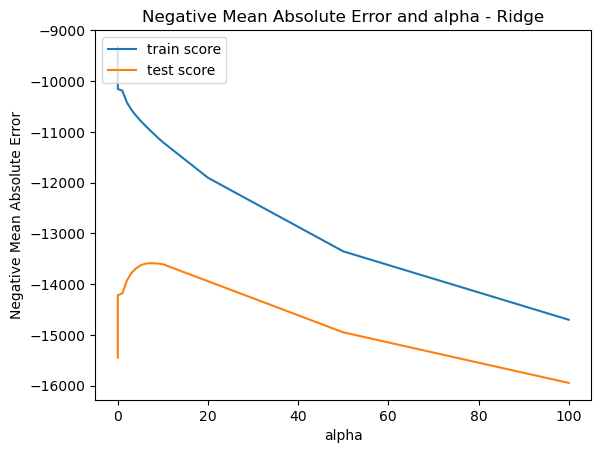

In [62]:
# plotting mean test and train scoes with alpha 
cv_results['param_alpha'] = cv_results['param_alpha'].astype('int32')

# plotting
plt.plot(cv_results['param_alpha'], cv_results['mean_train_score'])
plt.plot(cv_results['param_alpha'], cv_results['mean_test_score'])
plt.xlabel('alpha')
plt.ylabel('Negative Mean Absolute Error')
plt.title("Negative Mean Absolute Error and alpha - Ridge")
plt.legend(['train score', 'test score'], loc='upper left')
plt.show()

In [63]:
# View the optimal value of alpha for Ridge
model_cv.best_params_

{'alpha': 7.0}

In [64]:
# Create a dataframe of ridge cross validation results
model_cv_results = pd.DataFrame(model_cv.cv_results_)
model_cv_results

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.010421,0.006931,0.002397,0.000358,0.0001,{'alpha': 0.0001},-14023.304831,-15616.079019,-15979.378973,-16587.408375,-15019.274474,-15445.089135,874.343771,25,-9509.179548,-9284.198862,-9310.558288,-9117.264607,-9410.442219,-9326.328705,131.332358
1,0.006984,0.000745,0.002223,0.000333,0.001,{'alpha': 0.001},-14011.389621,-15614.411049,-15984.751383,-16550.069438,-15001.864063,-15432.497111,870.865855,24,-9510.063285,-9284.629081,-9313.024112,-9120.320200,-9413.582552,-9328.323846,130.925247
2,0.006663,0.000260,0.002416,0.000354,0.01,{'alpha': 0.01},-13902.974607,-15597.889365,-16041.955977,-16229.316945,-14852.929581,-15325.013295,854.551381,23,-9521.468617,-9288.937346,-9347.033103,-9155.380632,-9451.458039,-9352.855548,127.490077
3,0.007250,0.001413,0.002072,0.000252,0.05,{'alpha': 0.05},-13683.516840,-15531.701513,-16162.374628,-15650.298295,-14451.517959,-15095.881847,899.411248,22,-9643.523900,-9307.566195,-9479.774186,-9322.024838,-9628.929772,-9476.363778,143.905283
4,0.006717,0.000684,0.001906,0.000078,0.1,{'alpha': 0.1},-13541.661191,-15465.545855,-16156.959462,-15357.524785,-14257.936336,-14955.925526,932.824729,21,-9762.460500,-9333.853895,-9583.147744,-9486.216519,-9793.137009,-9591.763133,171.709357
5,0.006830,0.000470,0.002255,0.000391,0.2,{'alpha': 0.2},-13369.407643,-15360.671043,-16076.394329,-15028.623562,-13978.382124,-14762.695740,970.617908,19,-9926.269540,-9388.112985,-9692.591221,-9678.905546,-9995.039346,-9736.183728,214.230337
6,0.006346,0.000119,0.001977,0.000223,0.3,{'alpha': 0.3},-13242.940059,-15278.509011,-15979.840626,-14820.727344,-13790.095863,-14622.422581,990.767150,18,-10043.805881,-9437.945839,-9759.123918,-9802.672499,-10136.752503,-9836.060128,244.582544
7,0.006695,0.000460,0.001960,0.000211,0.4,{'alpha': 0.4},-13130.094896,-15212.002559,-15902.112386,-14671.040002,-13641.757523,-14511.401473,1011.404137,17,-10136.507838,-9485.238236,-9810.180400,-9894.385851,-10238.621376,-9912.986740,264.531101
8,0.006215,0.000683,0.001920,0.000145,0.5,{'alpha': 0.5},-13057.272343,-15160.674369,-15838.047909,-14564.562647,-13525.950127,-14429.301479,1023.354876,16,-10214.848413,-9531.408730,-9850.827298,-9967.145721,-10320.773538,-9977.000740,279.041341
9,0.007046,0.000564,0.002169,0.000377,0.6,{'alpha': 0.6},-12999.548961,-15117.110165,-15782.562130,-14477.908907,-13440.787679,-14363.583568,1030.195655,15,-10280.083334,-9574.194954,-9884.750261,-10025.827399,-10392.079279,-10031.387045,290.691106


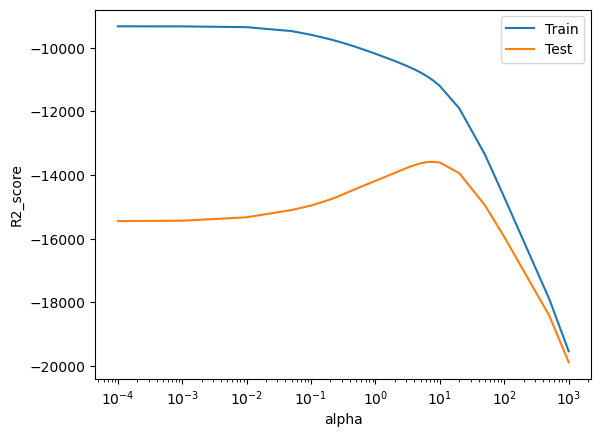

In [65]:
# Plotting R2 score vs alpha values - Ridge
plt.plot(model_cv_results['param_alpha'], model_cv_results['mean_train_score'], label='Train')
plt.plot(model_cv_results['param_alpha'], model_cv_results['mean_test_score'], label='Test')
plt.xlabel('alpha')
plt.ylabel('R2_score')
plt.xscale('log')
plt.legend()
plt.show()

It seems the optimum value of alpha (lambda) is 7.0. Let's build the Ridge regression model using this value.

In [66]:
# Create a ridge regression instance with alpha as 7.0
ridge = Ridge(alpha=7.0)

In [67]:
# Fit the model on training data
ridge.fit(X_train, y_train)

Ridge(alpha=7.0)

In [68]:
## View the coefficients of ridge regression fitted model
ridge.coef_

array([ 7.14636622e+02,  4.65635529e+03,  4.00840005e+03,  1.90197887e+03,
       -2.42132320e+02,  0.00000000e+00, -4.80090948e+03,  1.18137551e+04,
       -9.78199435e+02,  2.66294503e+03,  0.00000000e+00,  2.31510135e+04,
        2.12326016e+03,  0.00000000e+00,  1.04506063e+03, -7.31183482e+01,
       -1.23020702e+03,  0.00000000e+00, -5.78051804e+02,  2.35617757e+03,
       -4.72848758e+02,  2.97117201e+03,  3.78740810e+03,  1.68811941e+03,
        1.06559705e+03,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
        0.00000000e+00,  0.00000000e+00, -3.46975030e+02, -8.08947056e+03,
       -5.29621813e+02, -2.70094658e+02,  2.59833771e+03,  1.22247685e+03,
       -5.06830873e+02,  4.99609693e+03,  3.10369183e+03, -2.30273714e+03,
       -9.33350848e+02, -7.64635352e+03, -3.23772672e+03, -7.29443575e+03,
       -3.77957942e+03, -5.87041316e+03,  7.99517665e+03,  5.64937621e+03,
        6.13494143e+03,  1.48652032e+03,  2.93080845e+02, -7.09898229e+02,
       -4.06138681e+03,  

In [69]:
# Make predictions using Ridge
y_train_pred = ridge.predict(X_train)
y_pred = ridge.predict(X_test)

In [70]:
# R-squared of train and test data
print("R-Squared for Ridge (Train) =", '%.2f' % r2_score(y_train, y_train_pred))
print("R-Squared for Ridge (Test) =", '%.2f' % r2_score(y_test, y_pred))

R-Squared for Ridge (Train) = 0.94
R-Squared for Ridge (Test) = 0.90


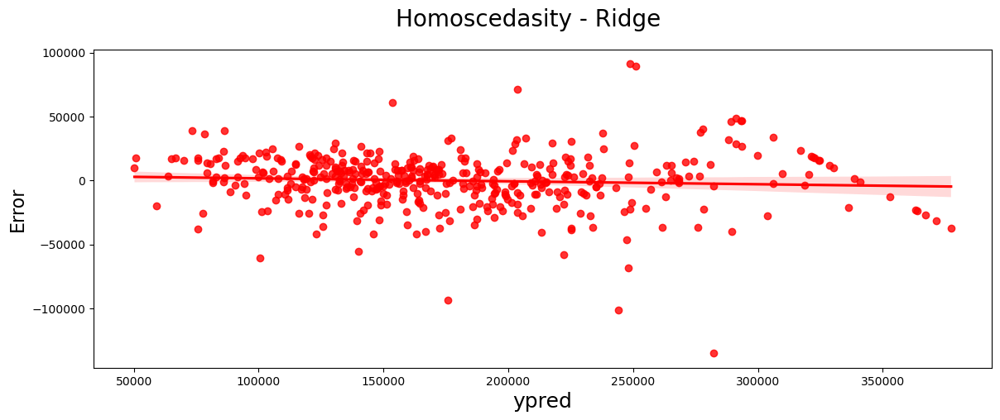

In [71]:
# Plot for Homoscedasity using Ridge
fig = plt.figure(figsize=(14,5))
sns.regplot(x=y_pred, y=y_test-y_pred,  color="red", marker='o')
fig.suptitle('Homoscedasity - Ridge', fontsize=20)
plt.xlabel('ypred', fontsize=18)   
plt.ylabel('Error', fontsize=16)
plt.show()

### Lasso Regression

In [72]:
# Lets find optimum value of alpha for lasso regression model using cross validation
params = {'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0,
                    2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50, 100, 500, 1000]}

lasso = Lasso()

lasso_model_cv = GridSearchCV(estimator = lasso, 
                        param_grid = params, 
                        scoring= 'neg_mean_absolute_error',  
                        cv = 5, 
                        return_train_score=True,
                        verbose = 1, n_jobs=-1)            
lasso_model_cv.fit(X_train, y_train) 

Fitting 5 folds for each of 28 candidates, totalling 140 fits


/Users/varunssharma/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.544e+10, tolerance: 3.734e+08
  model = cd_fast.enet_coordinate_descent(
/Users/varunssharma/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.241e+10, tolerance: 3.707e+08
  model = cd_fast.enet_coordinate_descent(
/Users/varunssharma/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

/Users/varunssharma/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.894e+10, tolerance: 3.769e+08
  model = cd_fast.enet_coordinate_descent(
/Users/varunssharma/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.485e+09, tolerance: 3.672e+08
  model = cd_fast.enet_coordinate_descent(
/Users/varunssharma/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

/Users/varunssharma/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.561e+09, tolerance: 3.707e+08
  model = cd_fast.enet_coordinate_descent(
/Users/varunssharma/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.800e+10, tolerance: 3.769e+08
  model = cd_fast.enet_coordinate_descent(
/Users/varunssharma/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

GridSearchCV(cv=5, estimator=Lasso(), n_jobs=-1,
             param_grid={'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 0.2, 0.3,
                                   0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0,
                                   4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50,
                                   100, 500, 1000]},
             return_train_score=True, scoring='neg_mean_absolute_error',
             verbose=1)

In [73]:
lasso_model_cv.best_params_

{'alpha': 100}

Here also, we're getting an alpha of 100. Let's build the lasso model using this value as alpha.

In [74]:
# Create a lasso regreesion instance with optimum value alpha=100
lasso = Lasso(alpha=100)

In [75]:
# Fit the model on training data
lasso.fit(X_train, y_train)

Lasso(alpha=100)

In [76]:
# View the coefficients of lasso fitted model
lasso.coef_

array([ 7.84638779e+02,  4.69695485e+03,  4.34786261e+03,  1.33063151e+03,
        1.62109218e+03,  0.00000000e+00, -3.03909755e+03,  1.05706231e+04,
       -0.00000000e+00,  1.82766946e+03,  0.00000000e+00,  2.31648403e+04,
        2.20840401e+03,  0.00000000e+00,  8.45762910e+02,  6.75587543e+01,
       -1.19659490e+03,  0.00000000e+00, -5.45670378e+02,  2.58856543e+03,
       -0.00000000e+00,  2.82229941e+03,  2.91466371e+03,  1.73122128e+03,
        7.25268221e+02,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
        0.00000000e+00,  0.00000000e+00, -1.79545047e+02, -1.00173441e+04,
       -0.00000000e+00, -0.00000000e+00,  0.00000000e+00,  3.65852380e+00,
        0.00000000e+00,  0.00000000e+00,  0.00000000e+00, -0.00000000e+00,
       -0.00000000e+00, -1.29817946e+04, -0.00000000e+00, -4.46816921e+03,
       -0.00000000e+00, -8.13244263e+03,  0.00000000e+00,  0.00000000e+00,
        3.86421050e+03, -0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
       -0.00000000e+00,  

In [77]:
# Make predictions using lasso
y_train_pred_lasso = lasso.predict(X_train)
y_pred_lasso = lasso.predict(X_test)

In [78]:
# R-squared of train and test data
print("R-Squared for Lasso (Train) =", '%.2f' % r2_score(y_train, y_train_pred_lasso))
print("R-Squared for Lasso (Test) =", '%.2f' % r2_score(y_test, y_pred_lasso))

R-Squared for Lasso (Train) = 0.94
R-Squared for Lasso (Test) = 0.89


In [79]:
# Create a dataframe of lasso cross validation results
lasso_cv_results= pd.DataFrame(lasso_model_cv.cv_results_)
lasso_cv_results

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.287205,0.024058,0.002594,0.000201,0.0001,{'alpha': 0.0001},-13993.566980,-15673.225044,-15857.447591,-16535.146319,-14956.319249,-15403.141037,865.716409,26,-9504.855139,-9284.022880,-9310.296952,-9119.120256,-9409.862747,-9325.631595,129.483076
1,0.255400,0.019559,0.007681,0.006730,0.001,{'alpha': 0.001},-13993.364050,-15673.005747,-15852.177313,-16529.397552,-14956.160715,-15400.821075,863.730274,25,-9504.834781,-9284.022936,-9310.311823,-9119.140755,-9409.875896,-9325.637238,129.472257
2,0.277832,0.016599,0.004149,0.003393,0.01,{'alpha': 0.01},-13991.182066,-15670.876823,-15799.470216,-16544.166607,-14954.435397,-15392.026222,863.139133,24,-9504.794899,-9284.123267,-9310.461687,-9119.403738,-9410.020117,-9325.760742,129.386109
3,0.259618,0.019444,0.002199,0.000102,0.05,{'alpha': 0.05},-13981.173755,-15663.306939,-15741.557020,-16542.546868,-14944.954807,-15374.707878,861.201564,23,-9504.563092,-9284.654427,-9310.981990,-9120.644801,-9410.739056,-9326.316673,128.973438
4,0.274414,0.033343,0.002977,0.001206,0.1,{'alpha': 0.1},-13968.556500,-15653.063425,-15737.576524,-16529.383886,-14927.086504,-15363.133368,862.483495,22,-9504.389901,-9285.271663,-9311.617592,-9122.499405,-9411.686759,-9327.093064,128.403541
5,0.255649,0.022769,0.002998,0.000911,0.2,{'alpha': 0.2},-13943.952399,-15631.875310,-15728.193356,-16496.278728,-14877.393524,-15335.538663,864.374909,21,-9504.759829,-9286.486764,-9313.723042,-9126.204294,-9413.788760,-9328.992538,127.473535
6,0.270408,0.006909,0.004131,0.003879,0.3,{'alpha': 0.3},-13924.212340,-15610.652129,-15719.360703,-16464.646693,-14823.906436,-15308.555660,865.778359,20,-9504.868798,-9287.748863,-9316.697681,-9130.414397,-9416.021709,-9331.150290,126.308145
7,0.254415,0.015631,0.003279,0.001346,0.4,{'alpha': 0.4},-13905.154715,-15590.464755,-15713.064576,-16433.162195,-14775.126176,-15283.394483,867.035854,19,-9504.951285,-9289.173801,-9319.247189,-9134.576227,-9418.159449,-9333.221590,125.140721
8,0.277992,0.026286,0.002567,0.000637,0.5,{'alpha': 0.5},-13888.009248,-15567.817631,-15703.969229,-16401.855119,-14727.253081,-15257.780861,867.392272,18,-9505.736045,-9290.601533,-9322.156896,-9138.092322,-9420.355555,-9335.388470,124.373965
9,0.280671,0.042389,0.007624,0.010858,0.6,{'alpha': 0.6},-13869.935101,-15546.756016,-15695.454608,-16369.094681,-14672.677204,-15230.783522,868.895991,17,-9507.197879,-9291.968321,-9325.290198,-9141.249709,-9423.216142,-9337.784450,124.000494


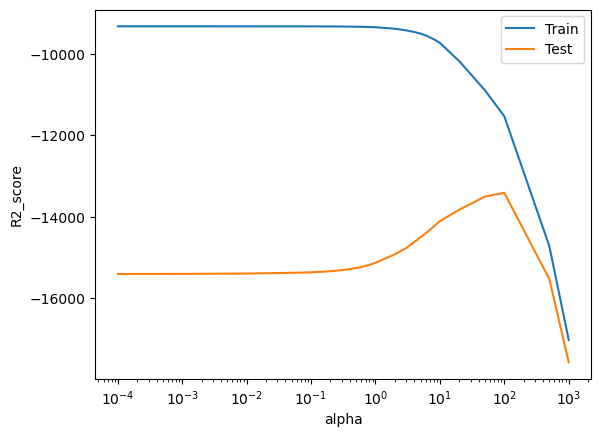

In [80]:
# Plotting R2 score vs alpha values for lasso
plt.plot(lasso_cv_results['param_alpha'], lasso_cv_results['mean_train_score'], label='Train')
plt.plot(lasso_cv_results['param_alpha'], lasso_cv_results['mean_test_score'], label='Test')
plt.xlabel('alpha')
plt.ylabel('R2_score')
plt.xscale('log')
plt.legend()
plt.show()

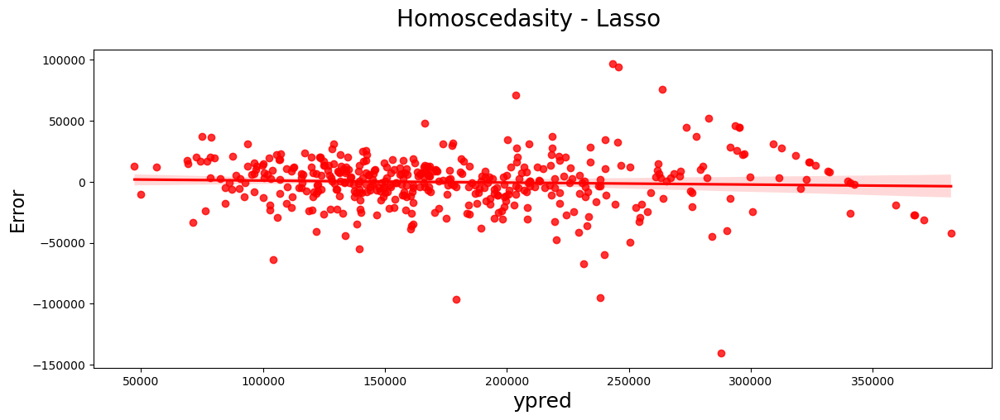

In [81]:
# Plot for Homoscedasity - lasso
fig = plt.figure(figsize=(14,5))
sns.regplot(x=y_pred_lasso, y=y_test-y_pred_lasso,  color="red", marker='o')
fig.suptitle('Homoscedasity - Lasso', fontsize=20)
plt.xlabel('ypred', fontsize=18)   
plt.ylabel('Error', fontsize=16)
plt.show()

Let's plot the error distribution for both Ridge and Lasso models for both train and test datasets.

Error distribution in train dataset


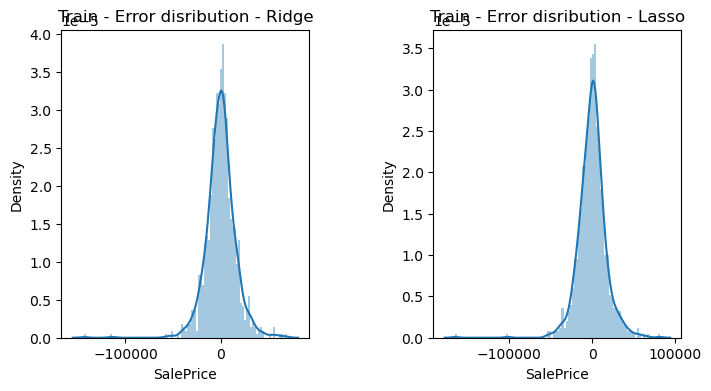

In [82]:
print('Error distribution in train dataset')
plt.figure(figsize=(8,4))
plt.subplot(1, 2, 1)
sns.distplot((y_train - y_train_pred), bins = 100)
plt.title('Train - Error disribution - Ridge')

plt.subplot(1, 2, 2)
sns.distplot((y_train - y_train_pred_lasso), bins = 100)
plt.title('Train - Error disribution - Lasso')

plt.subplots_adjust(wspace = .5)

Error distribution in test dataset


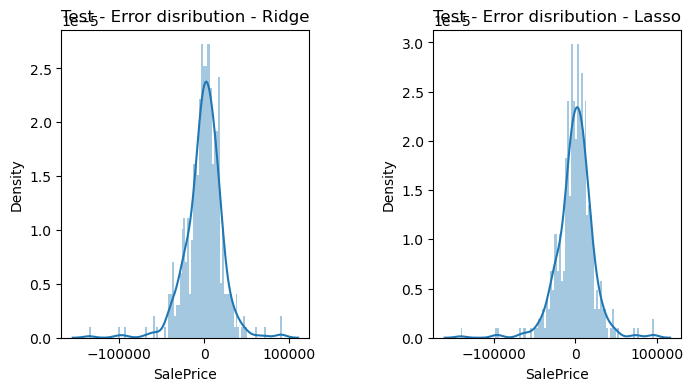

In [83]:
print('Error distribution in test dataset')
plt.figure(figsize=(8,4))
plt.subplot(1, 2, 1)
sns.distplot((y_test - y_pred), bins = 100)
plt.title('Test - Error disribution - Ridge')

plt.subplot(1, 2, 2)
sns.distplot((y_test - y_pred_lasso), bins = 100)
plt.title('Test - Error disribution - Lasso')

plt.subplots_adjust(wspace = .5)

### Observations:
- Error terms are normally distributed and centered around 0 for both the models for test as well as train.
- Error terms are randomly distributed across mean, which means the variance in error is constant and thereis no heteroscedasticity in the model.
- From the above two points, the output is well explained by both the models.

### Model Evaluation

In [87]:
table = {'Metric': ['R2 Score (Train)','R2 Score (Test)',' Diff in R2 train and test']}

metric = pd.DataFrame(table, columns = ['Metric'] )

r2_ridge_train = r2_score(y_train, y_train_pred)
r2_ridge_test = r2_score(y_test, y_pred)

metric_ridge = [
    round(r2_ridge_train, 4),
    round(r2_ridge_test, 4),
    round((r2_ridge_train - r2_ridge_test), 4)
]

r2_lasso_train = r2_score(y_train, y_train_pred_lasso)
r2_lasso_test = r2_score(y_test, y_pred_lasso)

metric_lasso = [
    round(r2_lasso_train, 4),
    round(r2_lasso_test, 4),
    round((r2_lasso_train - r2_lasso_test), 4)
]

ridge_metric = pd.Series(metric_ridge, name = 'Ridge Regression')
lasso_metric = pd.Series(metric_lasso, name = 'Lasso Regression')

final_metric = pd.concat([metric, ridge_metric, lasso_metric], axis = 1)

final_metric

,Metric,Ridge Regression,Lasso Regression
0,R2 Score (Train),0.9448,0.9374
1,R2 Score (Test),0.8963,0.8924
2,Diff in R2 train and test,0.0485,0.0450


### Observations:
- R2 value for Ridge is slightly higher than Lasso for both test and train sets.
- But the difference between test and train r2 square is lower in case of Lasso. So, it seems to be a better model out of the two.

### Alpha values:
- Ridge: alpha = 7.0
- Lasso: alpha = 100

Since difference between r2 score is lower in case of Lasso, I'm choosing to go with this Lasso model for this case.

Listing beta coefficients for Lasso model.

In [92]:
betas = pd.DataFrame(index=X_train.columns)
pd.set_option('display.max_rows', None)
betas['Ridge'] = ridge.coef_
betas['Lasso'] = lasso.coef_
betas.sort_values(by=['Lasso'], ascending=False).head(10)

,Ridge,Lasso
OverallQual_Excellent,32266.773364,49031.993624
OverallQual_Very_Good,24648.327905,32401.808354
GrLivArea,23151.013482,23164.840290
OverallCond_Excellent,17189.349380,22978.679409
Neighborhood_Crawfor,15357.554710,20911.475574
Neighborhood_Somerst,12218.519736,18041.796800
Exterior1st_BrkFace,12811.610219,17511.793653
Functional_Typ,13515.698964,14986.379968
Neighborhood_NridgHt,12009.719511,12416.166546
OverallQual_Good,9230.061425,11760.549928


---
## Subjective Questions

---
### Question 1:
What is the optimal value of alpha for ridge and lasso regression? What will be the changes in the model if you choose double the value of alpha for both ridge and lasso? What will be the most important predictor variables after the change is implemented?

As found earlier, the best alpha values for both regression models are:
- Ridge: alpha = 7.0
- Lasso: alpha = 100

If we double the values of these alphas, we'll get:
- Ridge: alpha_doubled = 14.0
- Lasso: alpha_doubled = 200

Let's rebuild the model using these alpha values and find out the changes.

In [93]:
# Create a ridge regression instance with alpha as 14.0
ridge_2 = Ridge(alpha=14.0)

# Fit the model on training data
ridge_2.fit(X_train, y_train)

# Make predictions using Ridge
y_train_pred_2 = ridge_2.predict(X_train)
y_pred_2 = ridge_2.predict(X_test)

# R-squared of train and test data
print("R-Squared for Ridge (Train) =", '%.2f' % r2_score(y_train, y_train_pred_2))
print("R-Squared for Ridge (Test) =", '%.2f' % r2_score(y_test, y_pred_2))


R-Squared for Ridge (Train) = 0.94
R-Squared for Ridge (Test) = 0.90


In [94]:
# Create a lasso regreesion instance with optimum value alpha=200
lasso_2 = Lasso(alpha=200)

# Fit the model on training data
lasso_2.fit(X_train, y_train)

# Make predictions using lasso
y_train_pred_lasso_2 = lasso_2.predict(X_train)
y_pred_lasso_2 = lasso_2.predict(X_test)

# R-squared of train and test data
print("R-Squared for Lasso (Train) =", '%.2f' % r2_score(y_train, y_train_pred_lasso_2))
print("R-Squared for Lasso (Test) =", '%.2f' % r2_score(y_test, y_pred_lasso_2))


R-Squared for Lasso (Train) = 0.93
R-Squared for Lasso (Test) = 0.89


In [95]:
betas['New Ridge'] = ridge_2.coef_
betas['New Lasso'] = lasso_2.coef_
betas.sort_values(by=['New Lasso'], ascending=False).head(50)

,Ridge,Lasso,New Ridge,New Lasso
OverallQual_Excellent,32266.773364,49031.993624,25986.511816,48308.622249
OverallQual_Very_Good,24648.327905,32401.808354,22014.891918,32186.695188
GrLivArea,23151.013482,23164.840290,20564.601186,23305.597375
Neighborhood_Crawfor,15357.554710,20911.475574,13045.749873,18302.452243
Functional_Typ,13515.698964,14986.379968,12070.356124,14758.305273
Neighborhood_Somerst,12218.519736,18041.796800,10372.094828,13851.029746
Exterior1st_BrkFace,12811.610219,17511.793653,10718.443836,13448.406479
OverallQual_Good,9230.061425,11760.549928,7572.578648,10737.187382
OverallCond_Excellent,17189.349380,22978.679409,12131.473132,10337.399822
Neighborhood_NridgHt,12009.719511,12416.166546,11249.389267,10017.744416


The values of beta coefficients seem to be decreasing in case of Lasso if we double the value of alpha. 
This is because the model penalises more with increase in the value of alpha.

The most significant predictor variables after the change are:


In [103]:
# top 5 predictor variables for Lasso after doubling the alpha to 200
betas['New Lasso'].sort_values(ascending=False).head(5)

OverallQual_Excellent    48308.622249
OverallQual_Very_Good    32186.695188
GrLivArea                23305.597375
Neighborhood_Crawfor     18302.452243
Functional_Typ           14758.305273
Name: New Lasso, dtype: float64

In [105]:
# top 5 predictor variables for Ridge after doubling the alpha to 14.0
betas['New Ridge'].sort_values(ascending=False).head(5)

OverallQual_Excellent    25986.511816
OverallQual_Very_Good    22014.891918
GrLivArea                20564.601186
Neighborhood_Crawfor     13045.749873
OverallCond_Excellent    12131.473132
Name: New Ridge, dtype: float64

---
### Question 2:
You have determined the optimal value of lambda for ridge and lasso regression during the assignment. Now, which one will you choose to apply and why?

In [107]:
final_metric

,Metric,Ridge Regression,Lasso Regression
0,R2 Score (Train),0.9448,0.9374
1,R2 Score (Test),0.8963,0.8924
2,Diff in R2 train and test,0.0485,0.0450


- As seen earlier, the difference between r2 scores for test and train datasets seem to be lower in case of Lasso.
- Since we have a large number of variables, feature selection will be handled by Lasso regression.
- So, I'd choose Lasso regression in this case.

---
### Question 3:
After building the model, you realised that the five most important predictor variables in the lasso model are not available in the incoming data. You will now have to create another model excluding the five most important predictor variables. Which are the five most important predictor variables now?

In [122]:
# Top 5 predictor variables in the lasso model
lasso_best_cols = betas['Lasso'].sort_values(ascending=False).head(5)
lasso_best_cols.index

Index(['OverallQual_Excellent', 'OverallQual_Very_Good', 'GrLivArea',
       'OverallCond_Excellent', 'Neighborhood_Crawfor'],
      dtype='object')

In [123]:
# Dropping these variables from test and train datasets.
X_train_new = X_train.drop(lasso_best_cols.index, axis=1)
X_test_new = X_test.drop(lasso_best_cols.index, axis=1)

In [124]:
# Lets find optimum value of alpha for lasso regression model using cross validation
params = {'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0,
                    2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50, 100, 500, 1000]}

lasso_new = Lasso()
lasso_model_cv = GridSearchCV(estimator = lasso_new, 
                        param_grid = params, 
                        scoring= 'neg_mean_absolute_error',  
                        cv = 5, 
                        return_train_score=True,
                        verbose = 1, n_jobs=-1)            
lasso_model_cv.fit(X_train_new, y_train)

lasso_model_cv.best_params_

Fitting 5 folds for each of 28 candidates, totalling 140 fits


/Users/varunssharma/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.710e+10, tolerance: 3.734e+08
  model = cd_fast.enet_coordinate_descent(
/Users/varunssharma/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.970e+10, tolerance: 3.707e+08
  model = cd_fast.enet_coordinate_descent(
/Users/varunssharma/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

/Users/varunssharma/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.528e+10, tolerance: 3.734e+08
  model = cd_fast.enet_coordinate_descent(
/Users/varunssharma/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.535e+10, tolerance: 3.672e+08
  model = cd_fast.enet_coordinate_descent(
/Users/varunssharma/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

/Users/varunssharma/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.173e+10, tolerance: 3.769e+08
  model = cd_fast.enet_coordinate_descent(
/Users/varunssharma/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.098e+09, tolerance: 3.672e+08
  model = cd_fast.enet_coordinate_descent(
/Users/varunssharma/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

{'alpha': 50}

In [125]:
# Create a lasso regreesion instance with optimum value alpha=50
lasso = Lasso(alpha=50)
# Fit the model on training data
lasso.fit(X_train_new, y_train)
# View the coefficients of lasso fitted model
lasso.coef_
# Make predictions using lasso
y_train_pred_lasso = lasso.predict(X_train_new)
y_pred_lasso = lasso.predict(X_test_new)

# R-squared of train and test data
print("R-Squared for Lasso (Train) =", '%.2f' % r2_score(y_train, y_train_pred_lasso))
print("R-Squared for Lasso (Test) =", '%.2f' % r2_score(y_test, y_pred_lasso))

R-Squared for Lasso (Train) = 0.94
R-Squared for Lasso (Test) = 0.88


In [134]:
ridge_new = Ridge()

# cross validation
folds = 5
model_cv = GridSearchCV(estimator = ridge_new, 
                        param_grid = params, 
                        scoring= 'neg_mean_absolute_error', 
                        cv = folds, 
                        return_train_score=True,
                        verbose = 1)            
model_cv.fit(X_train_new, y_train)

# View the optimal value of alpha for Ridge
model_cv.best_params_

Fitting 5 folds for each of 28 candidates, totalling 140 fits


{'alpha': 7.0}

In [135]:
# Create a ridge regression instance with alpha as 7.0
ridge = Ridge(alpha=7.0)

# Fit the model on training data
ridge.fit(X_train_new, y_train)

# Make predictions using Ridge
y_train_pred_new = ridge.predict(X_train_new)
y_pred_new = ridge.predict(X_test_new)

# R-squared of train and test data
print("R-Squared for Ridge (Train) =", '%.2f' % r2_score(y_train, y_train_pred_new))
print("R-Squared for Ridge (Test) =", '%.2f' % r2_score(y_test, y_pred_new))

R-Squared for Ridge (Train) = 0.93
R-Squared for Ridge (Test) = 0.89


The r2 value for Ridge seems to have dropped slightly to 0.93 and 0.89. But the difference is higher in case of Lasso where for train data it is 0.94 and for test, it is 0.88.
This means that for lasso, the model performance has dropped slightly when making predictions on test data.

The top 5 parameters for these two models now are:

In [141]:
# Ridge - top 5 predictor variables
betas_new = pd.DataFrame(index=X_train_new.columns)
pd.set_option('display.max_rows', None)
betas_new['Ridge without top 5'] = ridge.coef_
betas_new.sort_values(by=['Ridge without top 5'], ascending=False).head(5)

,Ridge without top 5
2ndFlrSF,17883.235635
Neighborhood_NridgHt,15350.816201
1stFlrSF,15307.997827
Neighborhood_StoneBr,15086.860607
Neighborhood_NoRidge,14390.931962


In [142]:
# lasso - top 5 predictor variables
betas_new = pd.DataFrame(index=X_train_new.columns)
pd.set_option('display.max_rows', None)
betas_new['Lasso without top 5'] = lasso.coef_
betas_new.sort_values(by=['Lasso without top 5'], ascending=False).head(5)

,Lasso without top 5
Condition2_PosA,74001.308618
2ndFlrSF,20383.901375
Exterior1st_BrkFace,20366.731882
Neighborhood_StoneBr,19020.046501
Neighborhood_Somerst,17522.815604


---
### Question 4:
How can you make sure that a model is robust and generalisable? What are the implications of the same for the accuracy of the model and why?

A model is said to be robust if any variation in the data doesn't drastically affect its performance.

A model is generalisable if it can adapt well to new, previously unseen data.

To make sure a model is robust and generalisable, we have to make sure the model doesn't overfit. A model is said to overfit if it performs very well on traning data with high accuracy, but fails miserably on unseen test data.
When a model is overfit, a slight variation in training data results in drastic decrease in the model performance in predicting target variable on test data.

To make sure our model doesn't overfit, it has to be not too complex. Simple models tend to have low variance and high bias, which means the model doesn't change much when there are any changes to training data. Since simpler models require less traning data, it is unlikely to overfit on the training data. Simpler models might have lower accuray on training data, but it performs well on new, unseen test data as it doesn't memorise the patterns in the training data set.

However, a very simple model can have very poor accuracy. So, we have to compromise on a point where the bias is not very high and the variance is also kept low to make a model robust and generalisable.